### Visualization analysis for MDH likely-wood-857 sequences with the GPT-2 model

In [2]:
from biosynseq import metrics
from biosynseq import visualize
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
from typing import List, Dict

In [3]:
%config InlineBackend.figure_format='retina'
%matplotlib inline
plt.rcParams['figure.figsize'] = [8,6]
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams.update({'font.size':14})

In [4]:
ls /homes/mzvyagin/mdh_gpt2/likely-wood-857

gpt2_mdh_4node_3mer.yaml
likely-wood-857_1024concat_seqs.fasta
likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy
likely-wood-857-128seqs_without_known_seq_check.fasta
likely-wood-857-128seqs_without_known_seq_check_fasta_embeddings_mean.npy
likely-wood-857-test_fasta_embeddings_mean.npy
likely-wood-857-train_fasta_embeddings_mean.npy
likely-wood-857-val_fasta_embeddings_mean.npy
mdh_gpt2.json
model-epoch72-val_loss0.89.pt


In [5]:
ls /homes/mzvyagin/mdh_gpt2/

earnest-river-122/               test_folder_concatenated.fasta
likely-wood-857/                 train_folder_concatenated.fasta
mdh_gpt2_likely-wood-857.tar.gz  val_folder_concatenated.fasta


# 1. Get t-SNE plots

### Generated Sequences

In [50]:
gen_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy")
gen_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857_1024concat_seqs.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/tsne_gen.png")

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/tsne_gen.png


{'GC':               z0          z1         GC
 0     144.213150 -227.000137  35.382956
 1     113.478889  -34.956169  44.867725
 2     148.414764 -149.764130  45.846818
 3     -10.227655  251.690842  63.862928
 4     103.211472 -196.882645  44.887526
 ...          ...         ...        ...
 1019  143.072510  -28.499306  39.139785
 1020 -102.167343   85.600739  44.883485
 1021   25.391462   12.571404  63.862928
 1022  -99.337799  198.570328  38.977636
 1023   -7.486560  -23.901239  53.141640
 
 [1024 rows x 3 columns],
 'SequenceLength':               z0          z1  SequenceLength
 0     144.213150 -227.000137             927
 1     113.478889  -34.956169             945
 2     148.414764 -149.764130             927
 3     -10.227655  251.690842             963
 4     103.211472 -196.882645             978
 ...          ...         ...             ...
 1019  143.072510  -28.499306             930
 1020 -102.167343   85.600739             987
 1021   25.391462   12.571404             

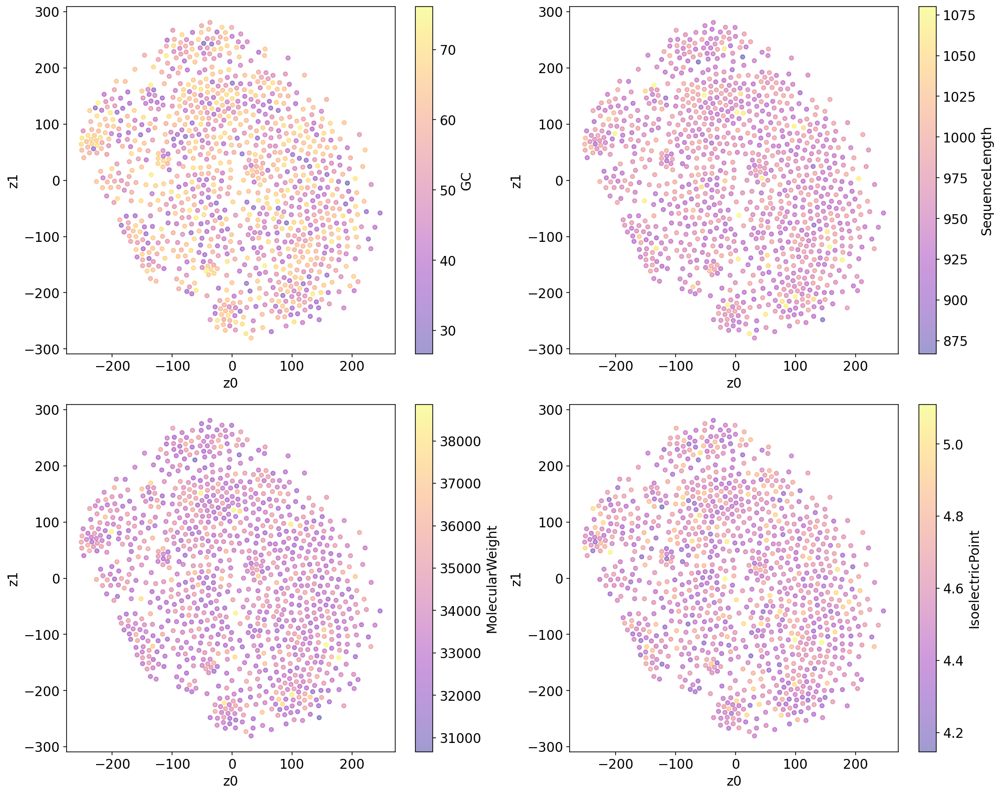

In [51]:
embed_avg = np.load(gen_embed_path)
gen_paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, 
                      paint_df=gen_paint_df, 
                      save_path = save_path, 
                      tsne_umap="tsne", 
                      get_subplots=True)

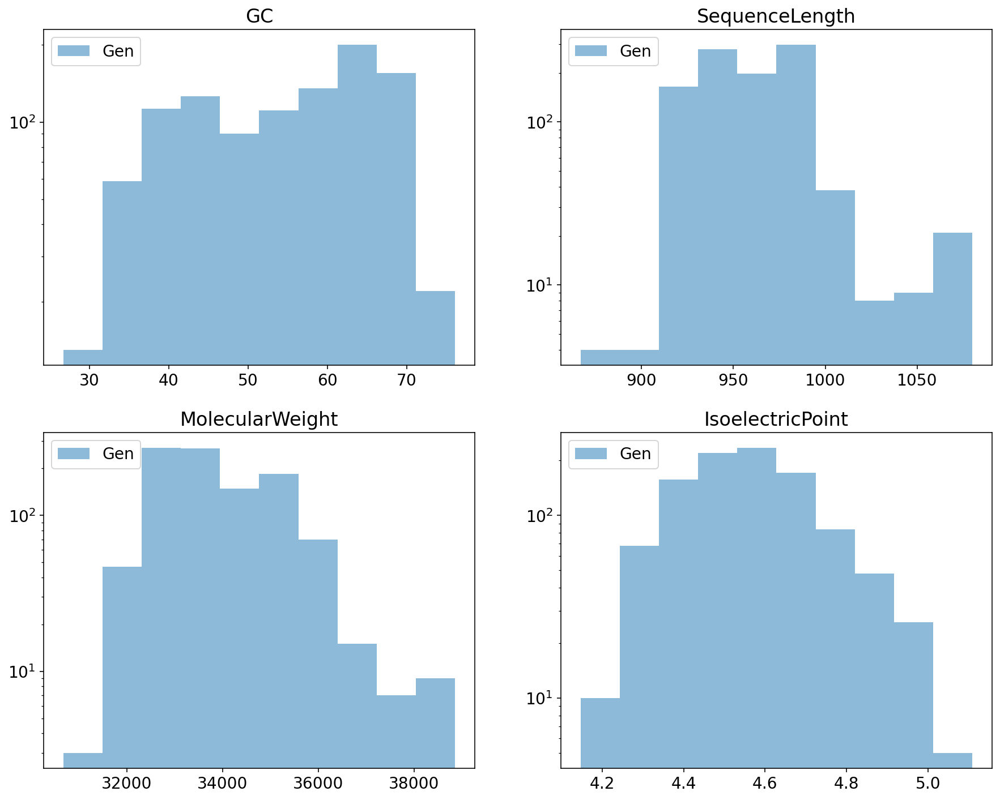

In [52]:
# plot the metrics distributions for the generated sequences
labels = ["Gen"]
paint_dfs = [gen_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

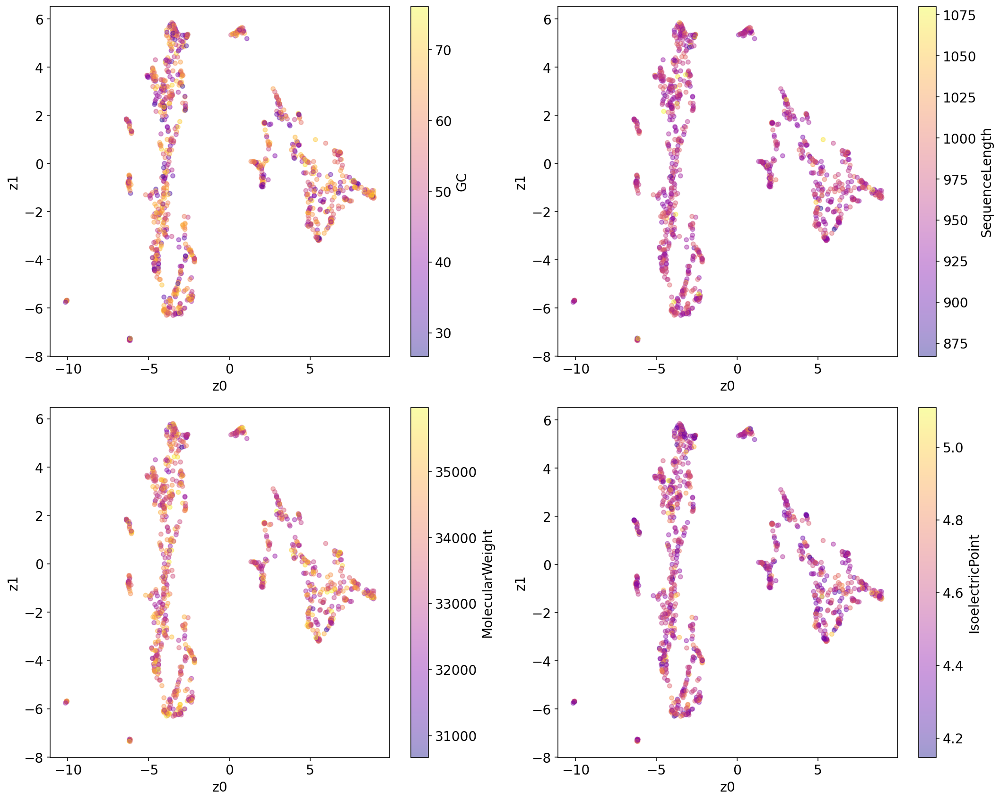

In [53]:
# replot the umap plot for generated sequences
# after eliminating outliers in molecular weight

# molecular weight < 36000 only

data_proj = visualize.run_umap(embed_data=embed_avg)

nrows = 2
ncols = 2
plt.figure(figsize=(15, 12))
cmap="plasma"

for n, key in enumerate(gen_paint_df):
    if key != "MolecularWeight":
        paint_name = key
        paint=gen_paint_df[key].values
        df = pd.DataFrame(
        {
            "z0": data_proj[:, 0],
            "z1": data_proj[:, 1],
            paint_name: paint[: data_proj.shape[0]],
        }
        )
        ax = plt.subplot(nrows, ncols, n+1)
        df.plot.scatter(x="z0", y="z1", ax=ax, c=paint_name, colormap=cmap, alpha=0.4)
    else: 
        paint_name = key
        paint=gen_paint_df[key].values
        iso_slice = (gen_paint_df[key] < 36000).values
        df = pd.DataFrame(
        {
            "z0": data_proj[iso_slice][:, 0],
            "z1": data_proj[iso_slice][:, 1],
            paint_name: paint[iso_slice][: data_proj[iso_slice].shape[0]],
        }
        )
        ax = plt.subplot(nrows, ncols, n+1)
        df.plot.scatter(x="z0", y="z1", ax=ax, c=paint_name, colormap=cmap, alpha=0.4)
plt.tight_layout()
        

### Test Sequences

In [8]:
test_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-test_fasta_embeddings_mean.npy")
test_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/test_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/tsne_test.png")

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


Your plot has been saved to /homes/lind/MDH-pipeline/visualize/tsne_test.png


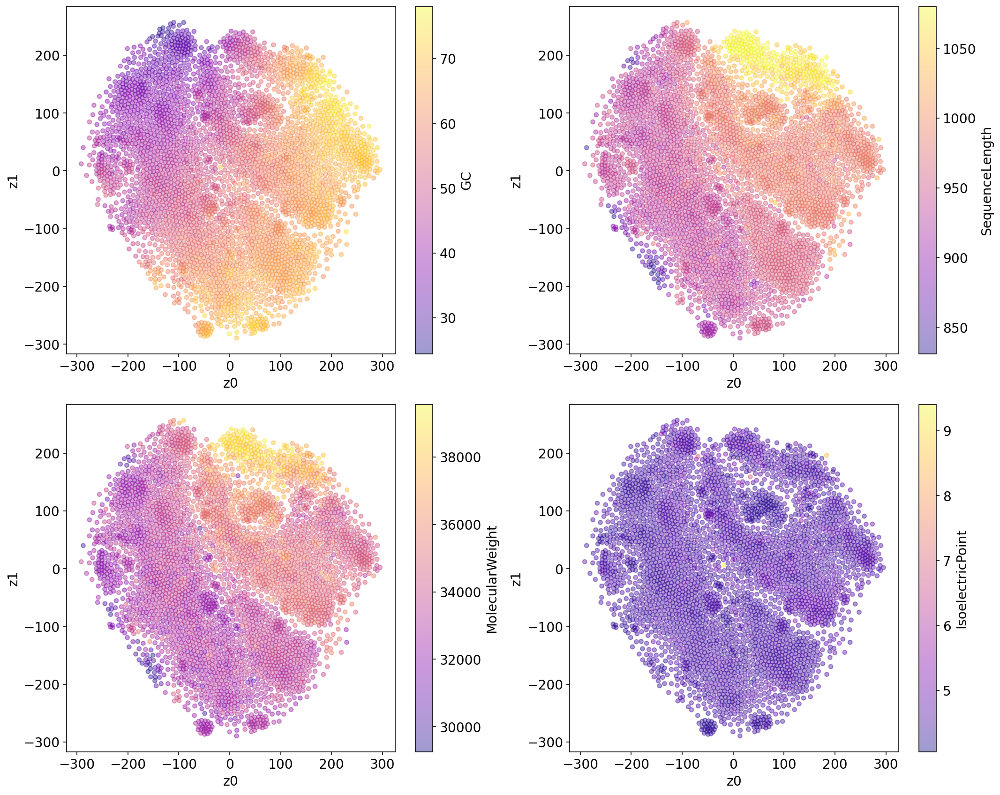

In [9]:
embed_avg = np.load(test_embed_path)
test_paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
test_tsne_results = visualize.get_cluster(embed_data=embed_avg, 
                                          paint_df=test_paint_df, 
                                          save_path = save_path, 
                                          tsne_umap="tsne", 
                                          get_subplots=True)

### Validation Sequences

In [10]:
val_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-val_fasta_embeddings_mean.npy")
val_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/val_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/")

Your plot has been saved to /homes/lind/MDH-pipeline/visualize


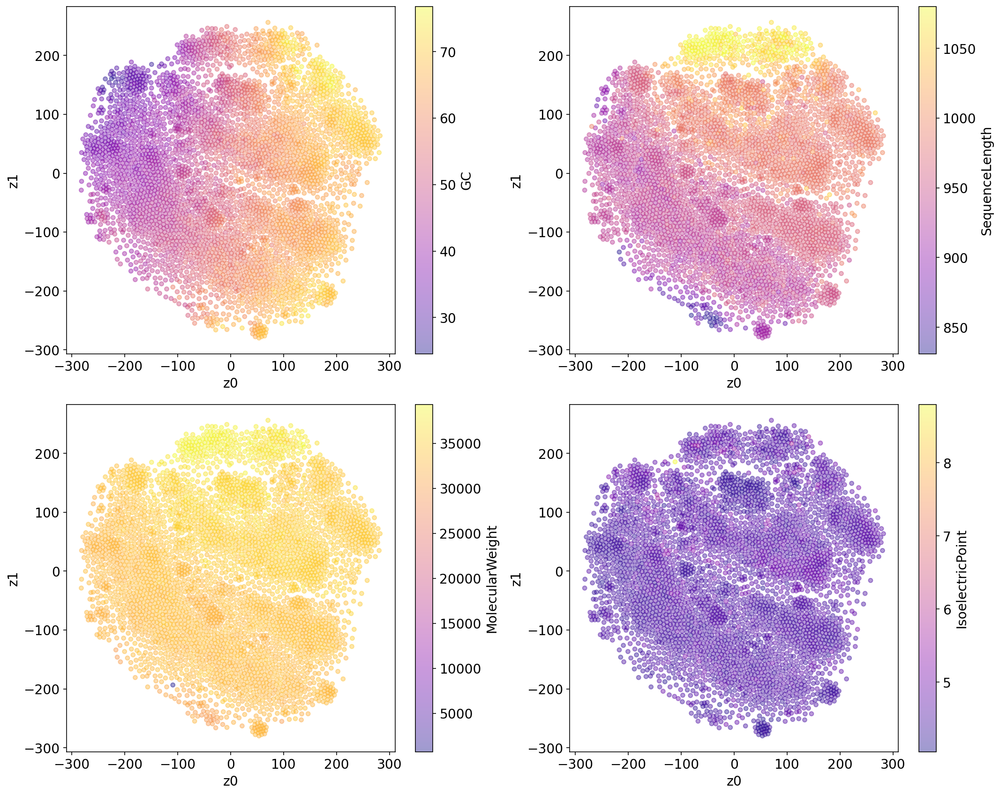

In [11]:
# embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
embed_avg = np.load(val_embed_path)
val_paint_df = visualize.get_paint_df(fasta_path=val_fasta_path, embed_path=val_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
val_tsne_results = visualize.get_cluster(embed_data=embed_avg, 
                                         paint_df=val_paint_df, 
                                         save_path = save_path, 
                                         tsne_umap="tsne", 
                                         get_subplots=True)

### Train Sequences

In [12]:
train_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-train_fasta_embeddings_mean.npy")
train_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/train_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/tsne_train.png")

[W] [11:13:20.207963] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...
Your plot has been saved to /homes/lind/MDH-pipeline/visualize/tsne_train.png


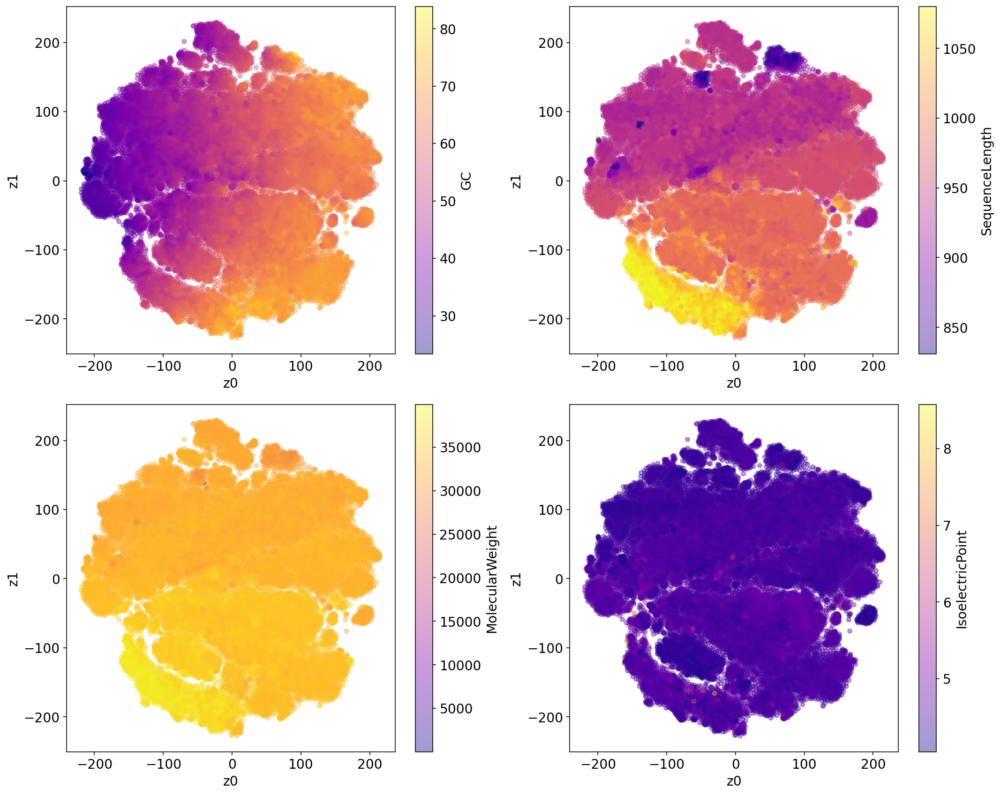

In [13]:
embed_avg = np.load(train_embed_path)
train_paint_df = visualize.get_paint_df(fasta_path=train_fasta_path, embed_path=train_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
train_tsne_results = visualize.get_cluster(embed_data=embed_avg, 
                                         paint_df=train_paint_df, 
                                         save_path = save_path, 
                                         tsne_umap="tsne", 
                                         get_subplots=True)

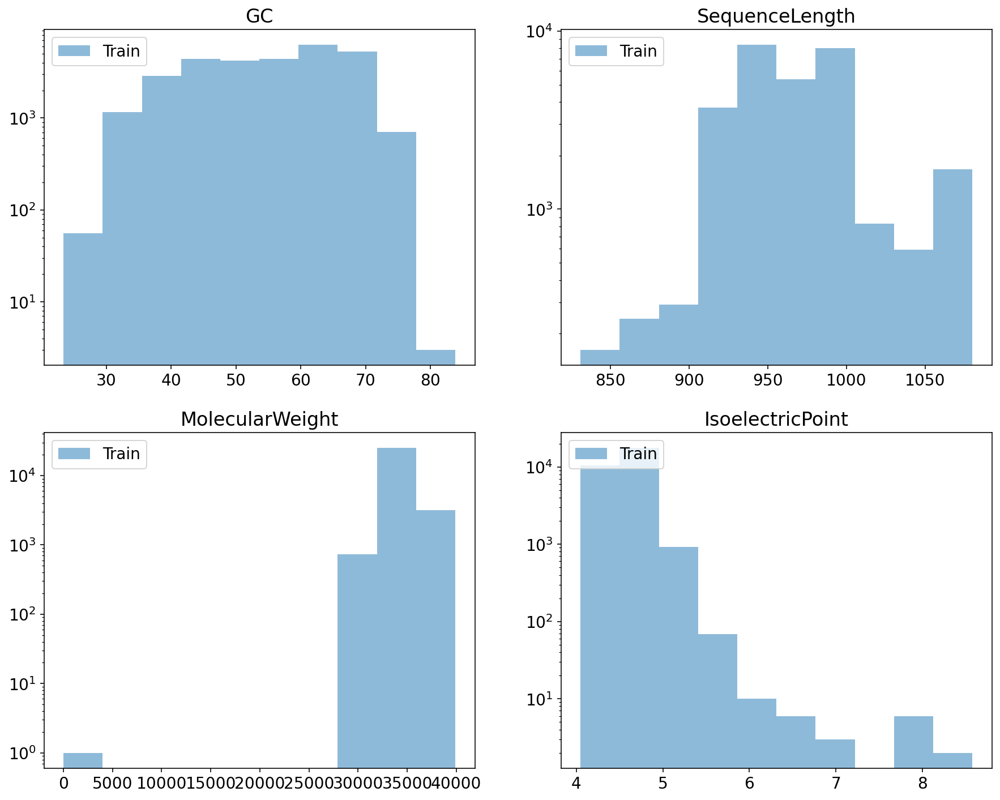

In [14]:
# plot the metrics distributions for the train sequences
labels = ["Train"]
paint_dfs = [train_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

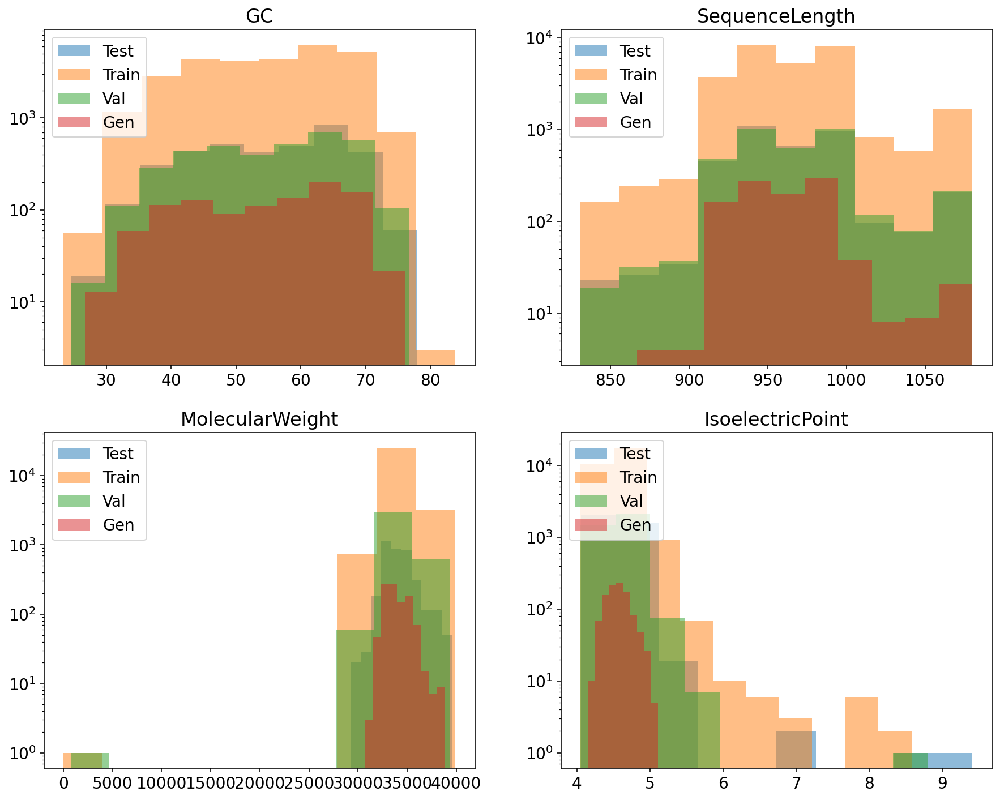

In [15]:
# plot the metrics distributions for the test, train, validation, and generated sequences against each other
labels = ["Test", "Train", "Val", "Gen"]
paint_dfs = [test_paint_df, train_paint_df, val_paint_df, gen_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

# 2. Get UMAP plots

### Generated Sequences (N=1024)

In [16]:
gen_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy")
gen_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857_1024concat_seqs.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_gen.png")

In [17]:
umap_n_neighbors = 15 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_gen.png


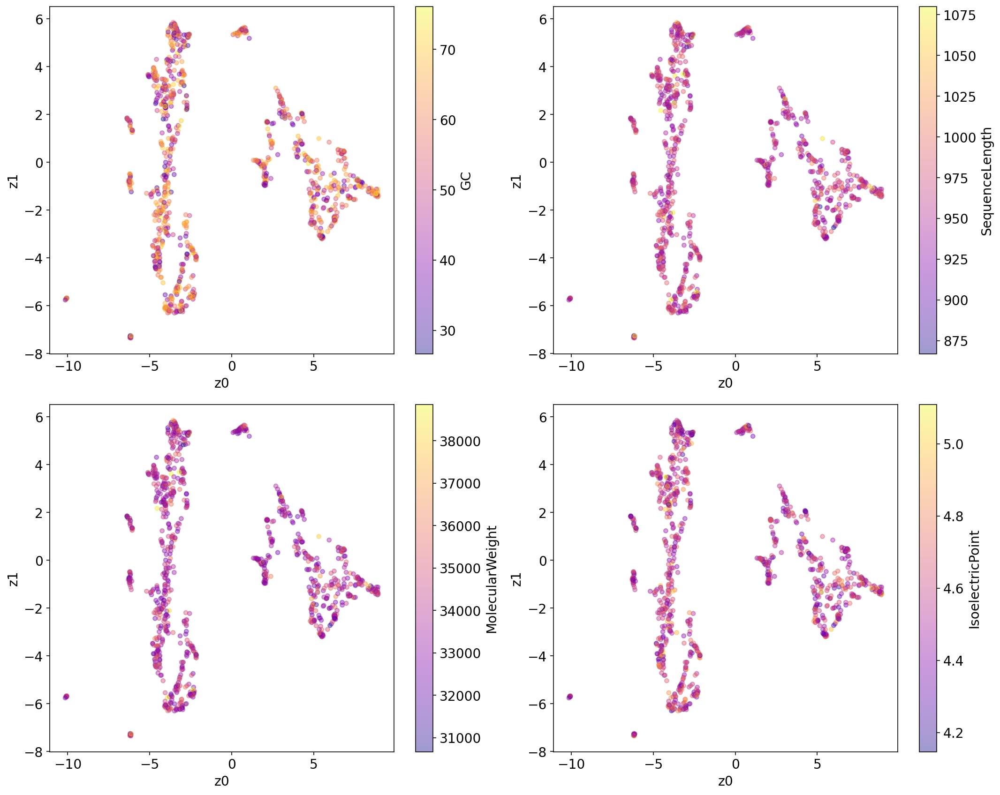

In [18]:
embed_avg = np.load(gen_embed_path)
gen_paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
test_umap_results = visualize.get_cluster(
    embed_data=embed_avg, 
    paint_df=gen_paint_df, 
    save_path = save_path, 
    tsne_umap="umap", 
    get_subplots=True, 
    umap_n_neighbors = umap_n_neighbors,
    umap_min_dist = umap_min_dist,
    umap_spread = umap_spread,
    umap_random_state=umap_random_state, 
)

### Test Sequences

In [36]:
test_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-test_fasta_embeddings_mean.npy")
test_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/test_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_test.png")

In [22]:
umap_n_neighbors = 15 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_test.png


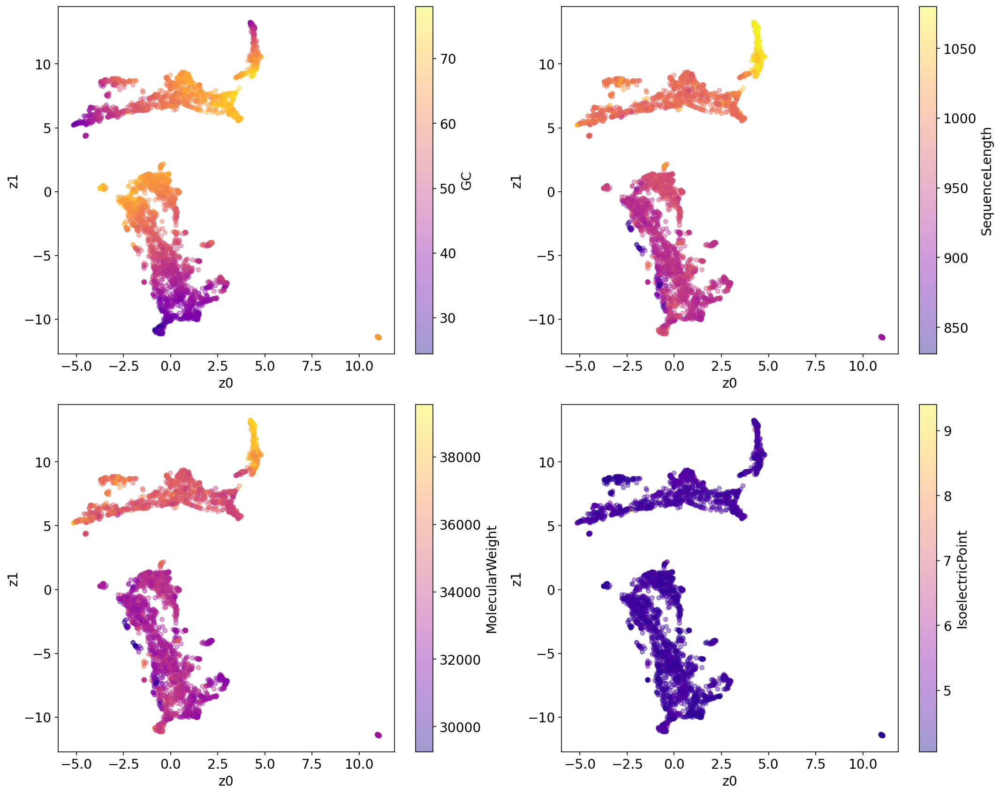

In [24]:
embed_avg = np.load(test_embed_path)
test_paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
test_umap_results = visualize.get_cluster(
    embed_data=embed_avg, 
    paint_df=test_paint_df, 
    save_path = save_path, 
    tsne_umap="umap", 
    get_subplots=True, 
    umap_n_neighbors = umap_n_neighbors,
    umap_min_dist = umap_min_dist,
    umap_spread = umap_spread,
    umap_random_state=umap_random_state, 
)

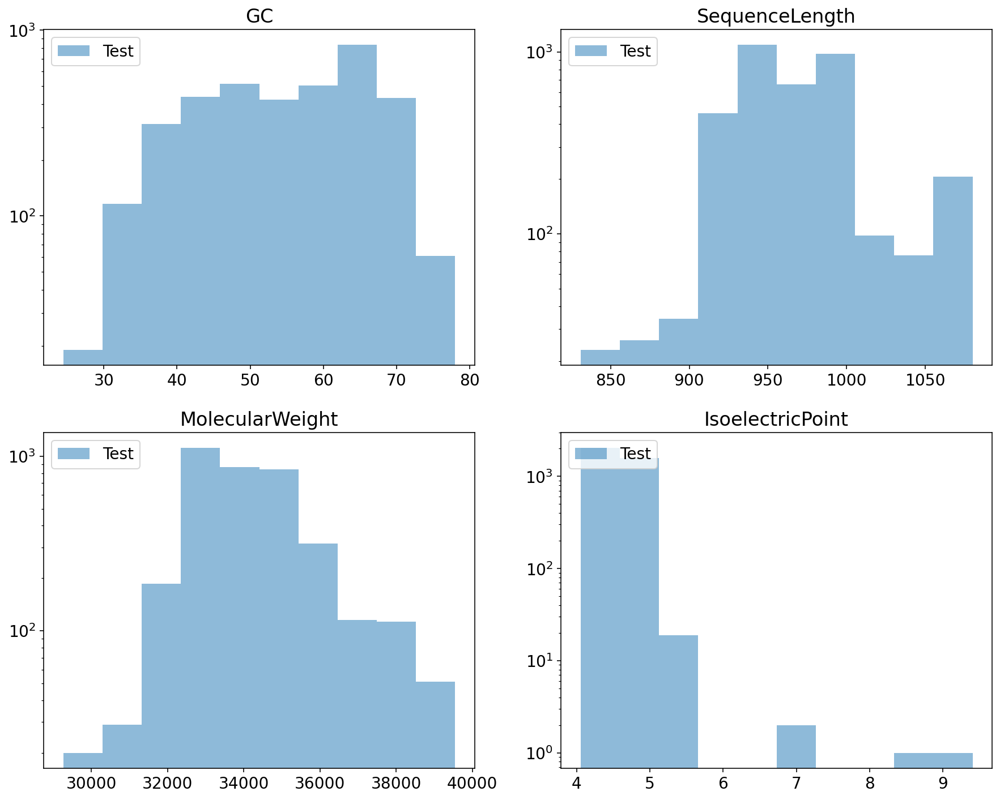

In [25]:
labels = ["Test"]
paint_dfs = [test_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

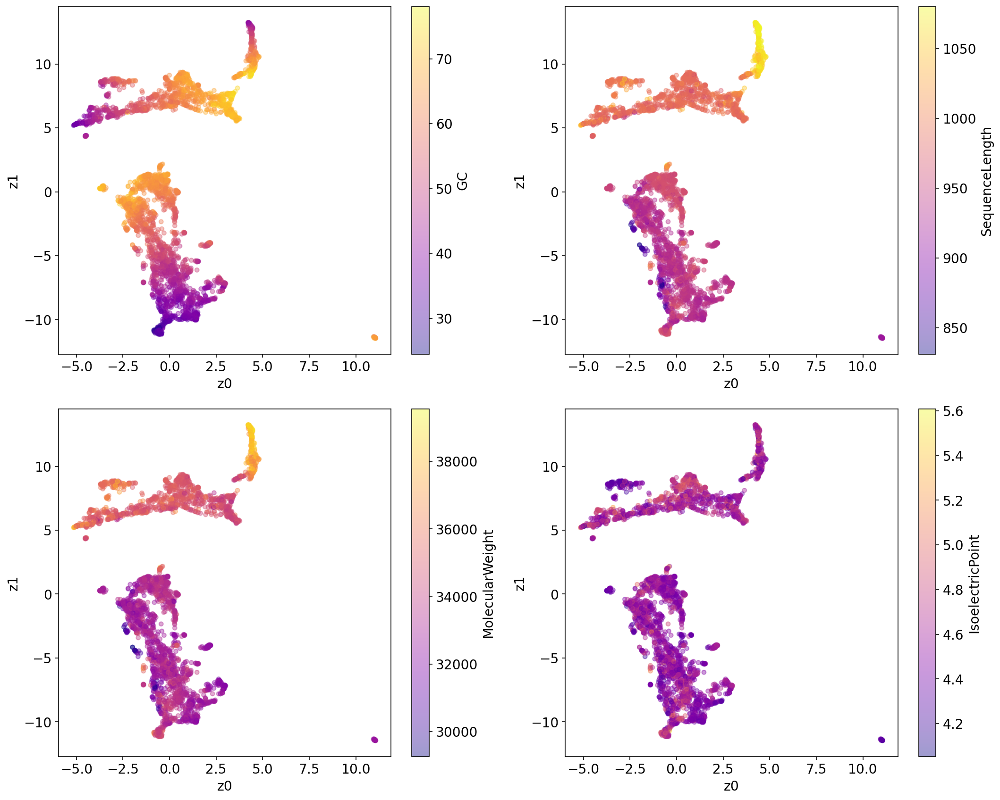

In [31]:
# replot the umap plot for test sequences
# after eliminating outliers in isoelectric point

# isoelectric point < 6 only

data_proj = visualize.run_umap(embed_data=embed_avg)

nrows = 2
ncols = 2
plt.figure(figsize=(15, 12))
cmap="plasma"

for n, key in enumerate(test_paint_df):
    if key != "IsoelectricPoint":
        paint_name = key
        paint=test_paint_df[key].values
        df = pd.DataFrame(
        {
            "z0": data_proj[:, 0],
            "z1": data_proj[:, 1],
            paint_name: paint[: data_proj.shape[0]],
        }
        )
        ax = plt.subplot(nrows, ncols, n+1)
        df.plot.scatter(x="z0", y="z1", ax=ax, c=paint_name, colormap=cmap, alpha=0.4)
    else: 
        paint_name = key
        paint=test_paint_df[key].values
        iso_slice = (test_paint_df[key] < 6).values
        df = pd.DataFrame(
        {
            "z0": data_proj[iso_slice][:, 0],
            "z1": data_proj[iso_slice][:, 1],
            paint_name: paint[iso_slice][: data_proj[iso_slice].shape[0]],
        }
        )
        ax = plt.subplot(nrows, ncols, n+1)
        df.plot.scatter(x="z0", y="z1", ax=ax, c=paint_name, colormap=cmap, alpha=0.4)
plt.tight_layout()
        

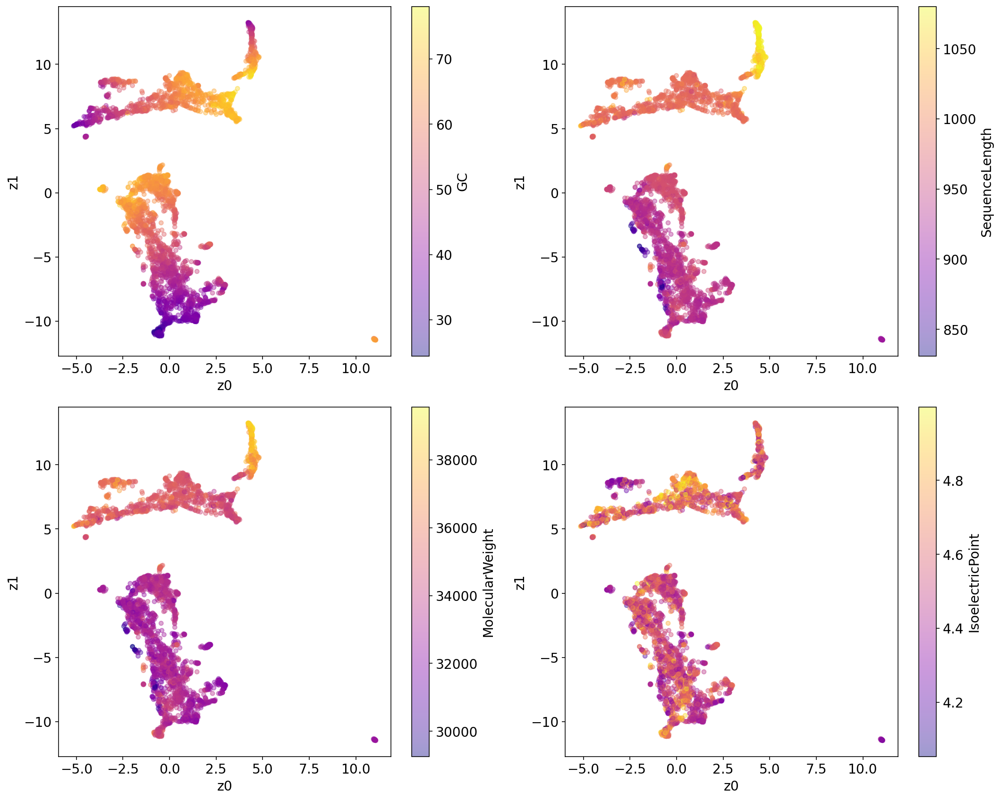

In [32]:
# isoelectric point < 5 only

data_proj = visualize.run_umap(embed_data=embed_avg)

nrows = 2
ncols = 2
plt.figure(figsize=(15, 12))
cmap="plasma"

for n, key in enumerate(test_paint_df):
    if key != "IsoelectricPoint":
        paint_name = key
        paint=test_paint_df[key].values
        df = pd.DataFrame(
        {
            "z0": data_proj[:, 0],
            "z1": data_proj[:, 1],
            paint_name: paint[: data_proj.shape[0]],
        }
        )
        ax = plt.subplot(nrows, ncols, n+1)
        df.plot.scatter(x="z0", y="z1", ax=ax, c=paint_name, colormap=cmap, alpha=0.4)
    else: 
        paint_name = key
        paint=test_paint_df[key].values
        iso_slice = (test_paint_df[key] < 5).values
        df = pd.DataFrame(
        {
            "z0": data_proj[iso_slice][:, 0],
            "z1": data_proj[iso_slice][:, 1],
            paint_name: paint[iso_slice][: data_proj[iso_slice].shape[0]],
        }
        )
        ax = plt.subplot(nrows, ncols, n+1)
        df.plot.scatter(x="z0", y="z1", ax=ax, c=paint_name, colormap=cmap, alpha=0.4)
plt.tight_layout()
        

### Validation Sequences

In [22]:
val_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-val_fasta_embeddings_mean.npy")
val_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/val_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_val.png")

In [23]:
umap_n_neighbors = 100 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_val.png


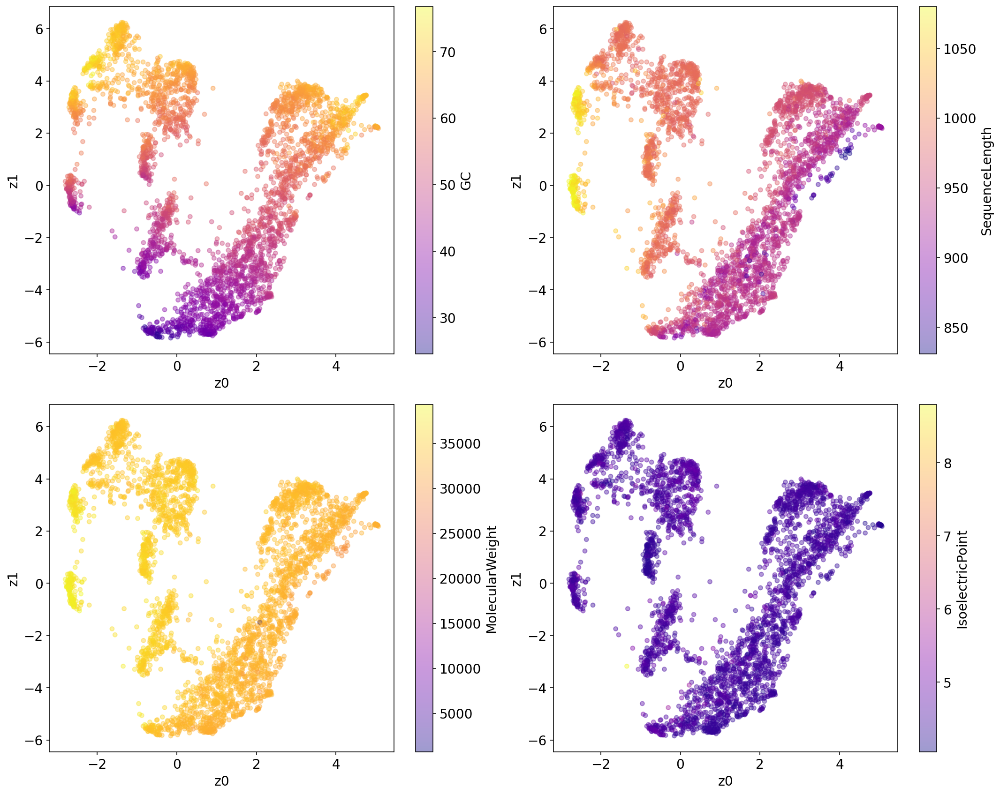

In [24]:
# embed_avg = metrics.get_embed_avg(embed_path=val_embed_path)
embed_avg = np.load(val_embed_path)
val_paint_df = visualize.get_paint_df(fasta_path=val_fasta_path, embed_path=val_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
val_umap_results = visualize.get_cluster(
    embed_data=embed_avg, 
    paint_df=val_paint_df, 
    save_path = save_path, 
    tsne_umap="umap", 
    get_subplots=True, 
    umap_n_neighbors = umap_n_neighbors,
    umap_min_dist = umap_min_dist,
    umap_spread = umap_spread,
    umap_random_state=umap_random_state, 
)

### Train Sequences

In [39]:
train_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-train_fasta_embeddings_mean.npy")
train_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/train_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_train.png")

In [26]:
umap_n_neighbors = 100 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_train.png


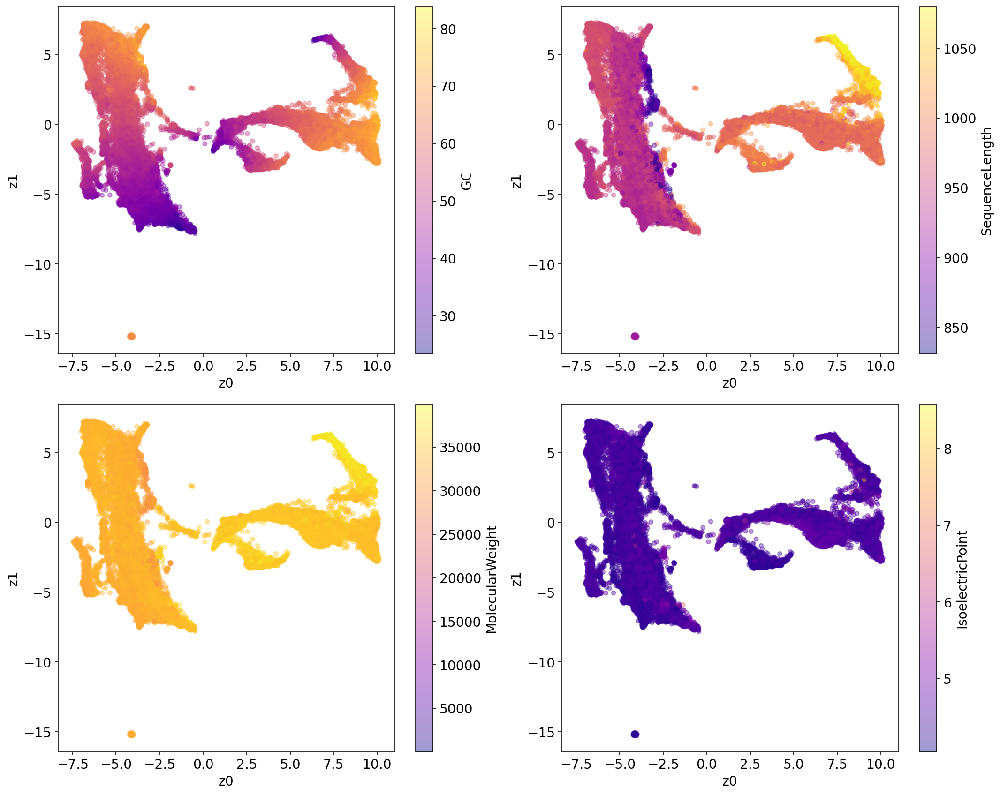

In [27]:
embed_avg = np.load(train_embed_path)
paint_df = visualize.get_paint_df(fasta_path=train_fasta_path, embed_path=train_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
train_umap_results = visualize.get_cluster(
    embed_data=embed_avg, 
    paint_df=paint_df, 
    save_path = save_path, 
    tsne_umap="umap", 
    get_subplots=True, 
    umap_n_neighbors = umap_n_neighbors,
    umap_min_dist = umap_min_dist,
    umap_spread = umap_spread,
    umap_random_state=umap_random_state, 
)

# 3. Compute alignment scores, and plot embedding L2 distance vs. alignment scores

## Global Alignment

### Generated Sequences

In [54]:
gen_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy")
gen_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857_1024concat_seqs.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_gen.png")
align_plot_title = "Generated Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [55]:
embed_avg = np.load(gen_embed_path)
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=gen_fasta_path)
gen_protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

In [56]:
gen_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=gen_protein_seqs,
    seqs2_rec=gen_protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

1024it [00:18, 55.16it/s]


In [57]:
gen_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=gen_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
gen_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.00000,-0.00987
Global Alignment Score,-0.00987,1.00000


<AxesSubplot:title={'center':'Generated Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

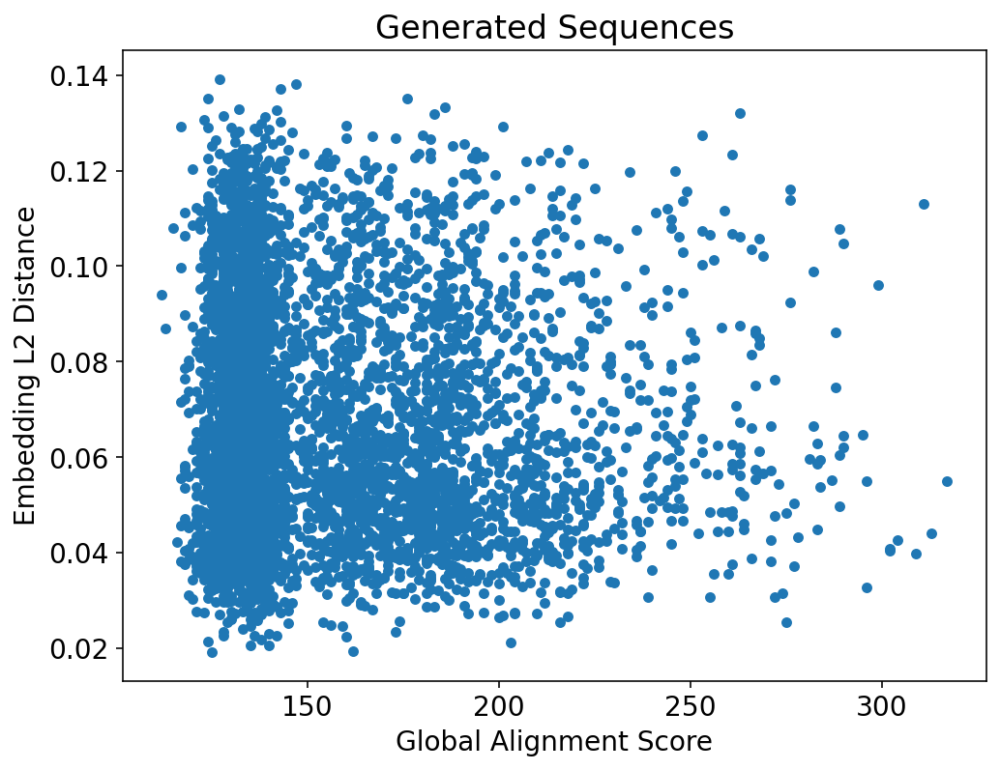

In [58]:
gen_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score",
                             title=align_plot_title)

In [59]:
gen_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=gen_scores_df, alignment_type=alignment_type
)
gen_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,0.312688,-0.080891
stdev_embed_dist,0.312688,1.000000,-0.039387
Global Alignment Score,-0.080891,-0.039387,1.000000


In [60]:
gen_avg_scores_df

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
0,0.040119,0.000000,102.0
1,0.079492,0.000000,103.0
2,0.065754,0.023288,104.0
3,0.054878,0.030517,105.0
4,0.038924,0.000000,106.0
...,...,...,...
220,0.066483,0.018082,322.0
221,0.055421,0.017582,323.0
222,0.058430,0.018290,324.0
223,0.059849,0.014281,325.0


Embedding distance vs. alignment score plot has been saved to /homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_gen.png.


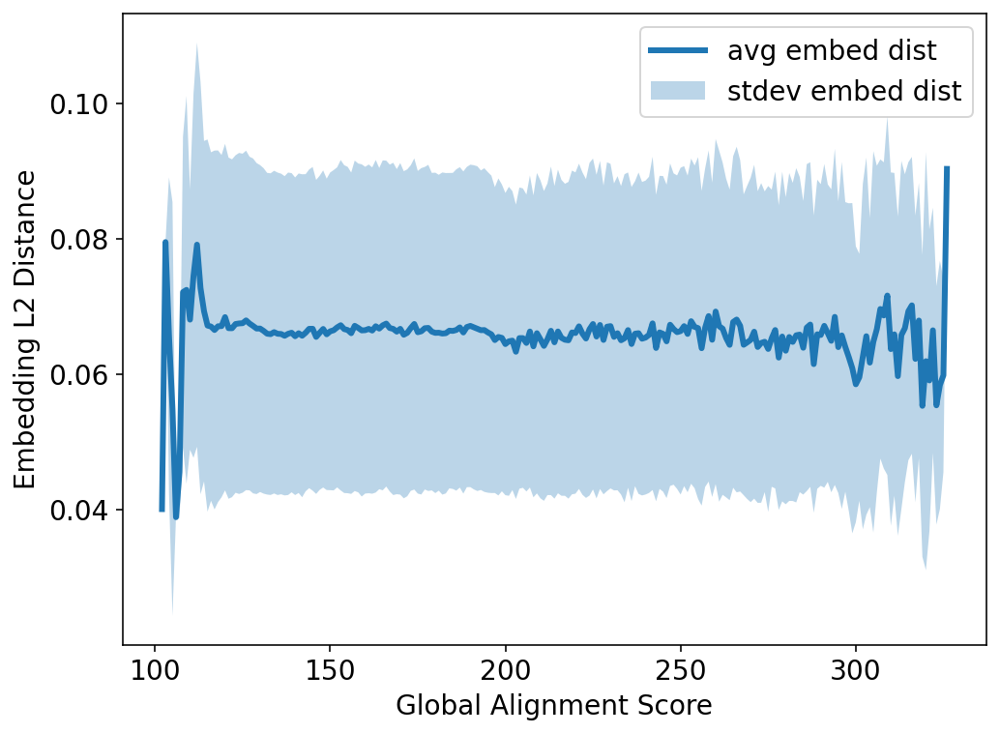

In [61]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=gen_avg_scores_df,
    save_path=save_path,
    alignment_type=alignment_type)

### Test Sequences

In [6]:
test_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-test_fasta_embeddings_mean.npy")
test_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/test_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_test.png")
align_plot_title = "Test Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [7]:
embed_avg = np.load(test_embed_path)
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=test_fasta_path)
embed = np.load(test_embed_path)
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
test_protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [12]:
test_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=test_protein_seqs,
    seqs2_rec=test_protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

3656it [04:07, 14.78it/s]


In [14]:
test_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=test_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
test_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,-0.285571
Global Alignment Score,-0.285571,1.000000


<AxesSubplot:title={'center':'Test Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

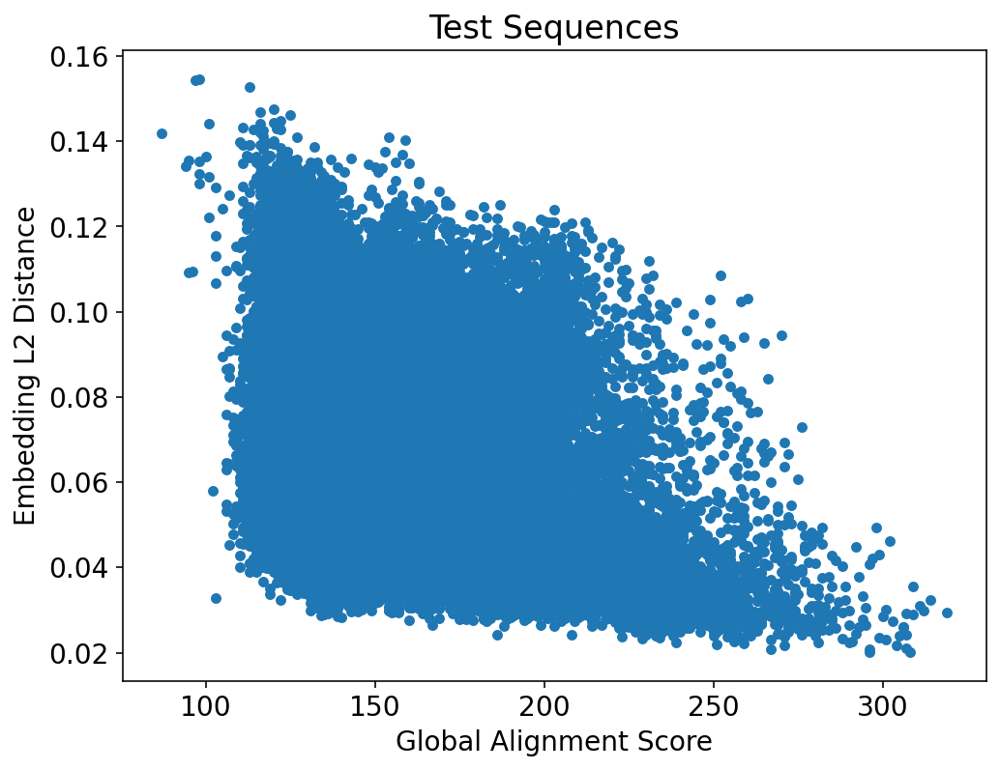

In [16]:
test_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score",
                             title="Test Sequences")

In [17]:
test_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=test_scores_df, alignment_type=alignment_type
)
test_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,0.193558,-0.912299
stdev_embed_dist,0.193558,1.000000,-0.487159
Global Alignment Score,-0.912299,-0.487159,1.000000


In [18]:
test_avg_scores_df

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
0,0.138697,0.000000,73.0
1,0.137420,0.000000,75.0
2,0.146358,0.000000,76.0
3,0.129598,0.000000,77.0
4,0.131805,0.002801,78.0
...,...,...,...
259,0.025881,0.000000,336.0
260,0.023885,0.000000,338.0
261,0.020359,0.000000,342.0
262,0.025187,0.000000,343.0


In [45]:
min_score = np.min(test_avg_scores_df["Global Alignment Score"])
print(min_score)
max_score = np.max(test_avg_scores_df["Global Alignment Score"])
print(max_score)

73.0
348.0


Embedding distance vs. alignment score plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_train.png.


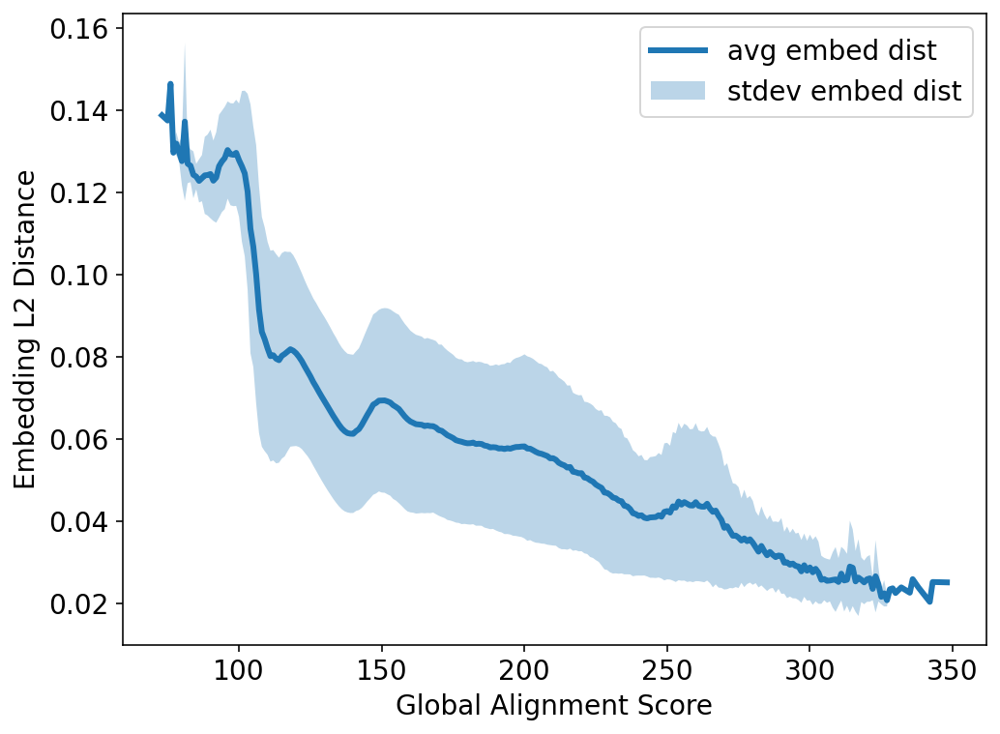

In [48]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=test_avg_scores_df,
    save_path=save_path,
    alignment_type=alignment_type)

In [20]:
# calculate the p-value of the Pearson correlation
from scipy.stats.stats import pearsonr

#calculation correlation coefficient and p-value between average embedding distance and global alignment score
corr_result = pearsonr(test_avg_scores_df["avg_embed_dist"], test_avg_scores_df["Global Alignment Score"])
pearson_corr = corr_result[0] # Pearson correlation
p_val = corr_result[1] # p-value
print(corr_result)
print(pearson_corr)
print(p_val)

(-0.9122990023058648, 1.4102967276034634e-103)
-0.9122990023058648
1.4102967276034634e-103


/tmp/ipykernel_959111/3023642792.py:2: DeprecationWarning: Please use `pearsonr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import pearsonr


### Validation Sequences

In [44]:
val_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-val_fasta_embeddings_mean.npy")
val_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/val_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_val.png")
align_plot_title = "Validation Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [45]:
embed_avg = np.load(val_embed_path)
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=val_fasta_path)
embed = np.load(val_embed_path)
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
val_protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [46]:
val_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=val_protein_seqs,
    seqs2_rec=val_protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

3664it [04:37, 13.20it/s]


In [47]:
val_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=val_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
val_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,-0.283209
Global Alignment Score,-0.283209,1.000000


<AxesSubplot:title={'center':'Validation Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

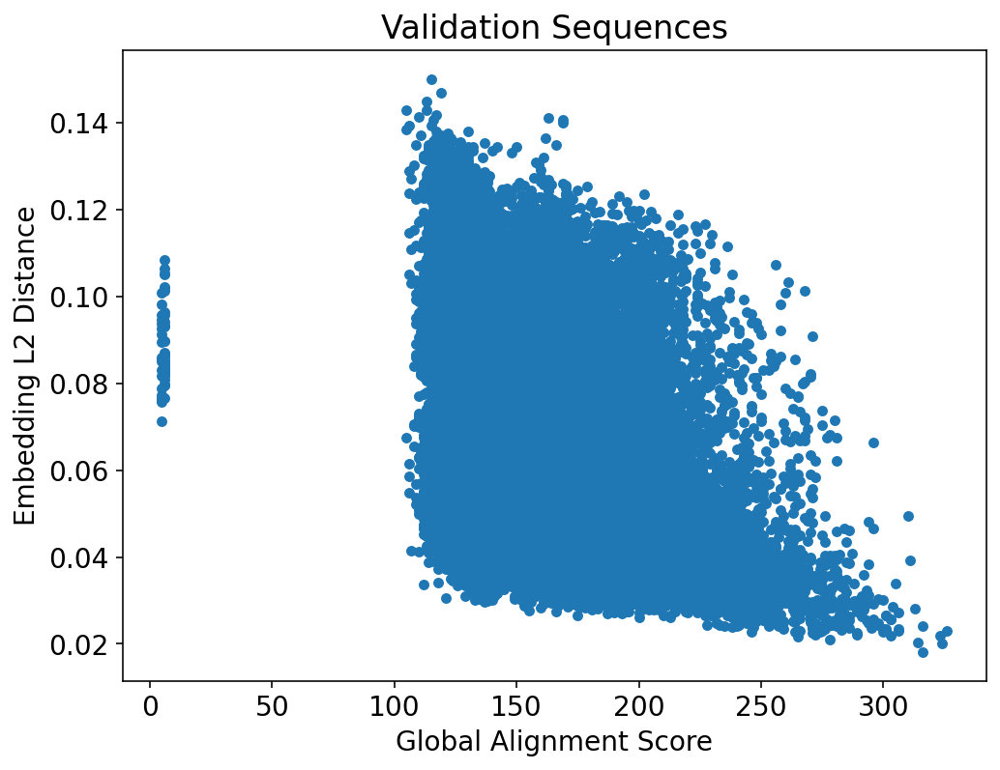

In [48]:
val_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score", 
                              title=align_plot_title)

In [49]:
val_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=val_scores_df, alignment_type=alignment_type
)
val_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,0.638318,-0.926802
stdev_embed_dist,0.638318,1.000000,-0.730009
Global Alignment Score,-0.926802,-0.730009,1.000000


Embedding distance vs. alignment score plot has been saved to /homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_val.png.


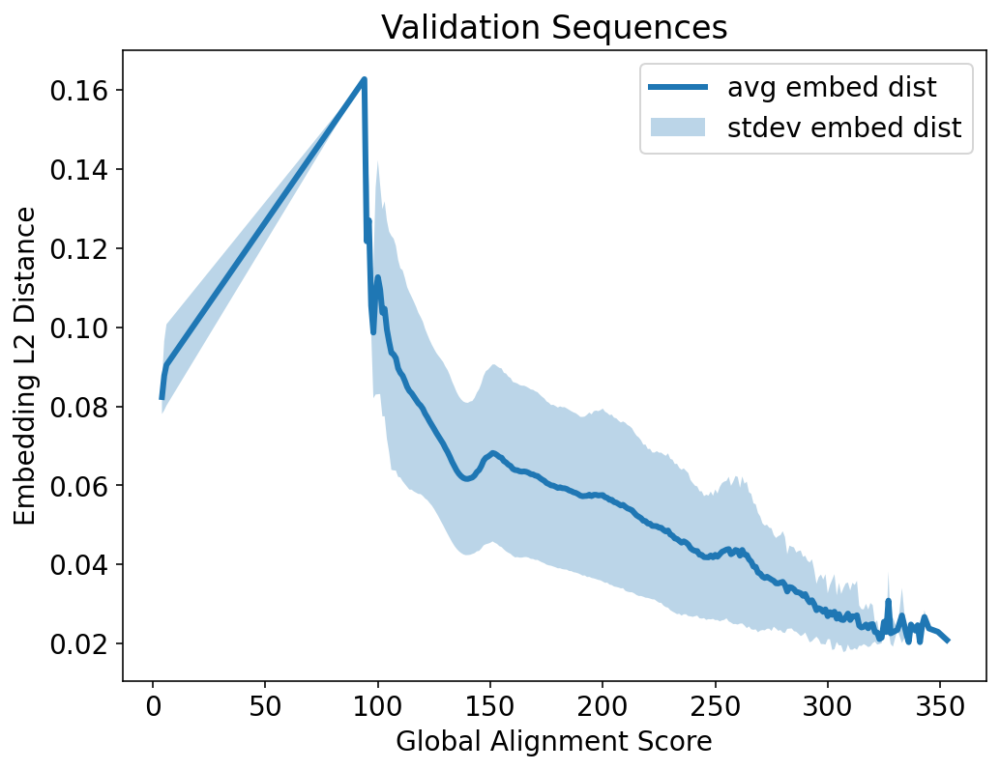

In [50]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=val_avg_scores_df,
    save_path=save_path,
    alignment_type=alignment_type,
    plot_title=align_plot_title
)

# 4. Compute global alignment scores between generated sequences and val/test sequences

### gen vs val sequences

In [51]:
# compute global alignment scores between each of the generated sequences and all of the validation sequences
gen_val_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=gen_protein_seqs,
    seqs2_rec=val_protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

1024it [02:22,  7.21it/s]


In [52]:
gen_val_align_scores_matrix

array([[139., 148., 161., ..., 156., 155., 127.],
       [133., 170., 173., ..., 170., 175., 121.],
       [129., 189., 187., ..., 197., 202., 123.],
       ...,
       [134., 221., 175., ..., 185., 174., 129.],
       [139., 175., 230., ..., 188., 255., 129.],
       [273., 142., 139., ..., 143., 140., 133.]])

In [53]:
np.save("gen_val_align_scores_matrix.npy", gen_val_align_scores_matrix)

In [54]:
# Indeed, we see that the dimensions of the resulting scores matrix is
# length of the generated seqs by the length of the validation seqs
gen_val_align_scores_matrix.shape

(1024, 3664)

In [55]:
# get the mean alignment scores
mean_gen_val_align_scores_matrix = metrics.get_mean_align_scores(gen_val_align_scores_matrix)

print(mean_gen_val_align_scores_matrix)
print(mean_gen_val_align_scores_matrix.shape)

[148.64683406 152.19268559 159.32723799 ... 160.74699782 155.66348253
 140.38919214]
(1024,)


In [56]:
# get the max alignment scores
max_gen_val_align_scores_matrix = metrics.get_max_align_scores(gen_val_align_scores_matrix)

print(max_gen_val_align_scores_matrix)
print(max_gen_val_align_scores_matrix.shape)

[283. 271. 267. ... 301. 282. 291.]
(1024,)


In [57]:
# get the min alignment scores
min_gen_val_align_scores_matrix = metrics.get_min_align_scores(gen_val_align_scores_matrix)

print(min_gen_val_align_scores_matrix)
print(min_gen_val_align_scores_matrix.shape)

[6. 6. 6. ... 6. 5. 5.]
(1024,)


### gen vs test sequences

In [58]:
# compute global alignment scores between each of the generated sequences and all of the test sequences
gen_test_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=gen_protein_seqs,
    seqs2_rec=test_protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

1024it [01:57,  8.72it/s]


In [59]:
gen_test_align_scores_matrix

array([[134., 126., 122., ..., 131., 154., 129.],
       [130., 120., 124., ..., 128., 190., 128.],
       [134., 123., 124., ..., 126., 207., 136.],
       ...,
       [138., 136., 126., ..., 131., 177., 136.],
       [139., 128., 121., ..., 124., 192., 129.],
       [256., 132., 133., ..., 132., 135., 133.]])

In [60]:
np.save("gen_test_align_scores_matrix.npy", gen_test_align_scores_matrix)

In [61]:
# Indeed, we see that the dimensions of the resulting scores matrix is
# length of the generated seqs by the length of the test seqs
gen_test_align_scores_matrix.shape

(1024, 3656)

In [62]:
# get the mean alignment scores
mean_gen_test_align_scores_matrix = metrics.get_mean_align_scores(gen_test_align_scores_matrix)

print(mean_gen_test_align_scores_matrix)
print(mean_gen_test_align_scores_matrix.shape)

[149.25793217 152.50464989 160.34436543 ... 162.40536105 156.93271335
 140.82439825]
(1024,)


In [63]:
# get the max alignment scores
max_gen_test_align_scores_matrix = metrics.get_max_align_scores(gen_test_align_scores_matrix)

print(max_gen_test_align_scores_matrix)
print(max_gen_test_align_scores_matrix.shape)

[285. 271. 268. ... 302. 284. 288.]
(1024,)


In [64]:
# get the min alignment scores
min_gen_test_align_scores_matrix = metrics.get_min_align_scores(gen_test_align_scores_matrix)

print(min_gen_test_align_scores_matrix)
print(min_gen_test_align_scores_matrix.shape)

[ 90.  90.  93. ... 100.  92. 101.]
(1024,)


# 5. Plot global alignment scores between gen vs. val/test sequences

In [65]:
xvals = np.arange(1, 1025, 1)
print(xvals)

[   1    2    3 ... 1022 1023 1024]


### gen vs val sequences

Text(0.5, 1.0, 'Global Alignment Scores Between Generated and Validation Sequences')

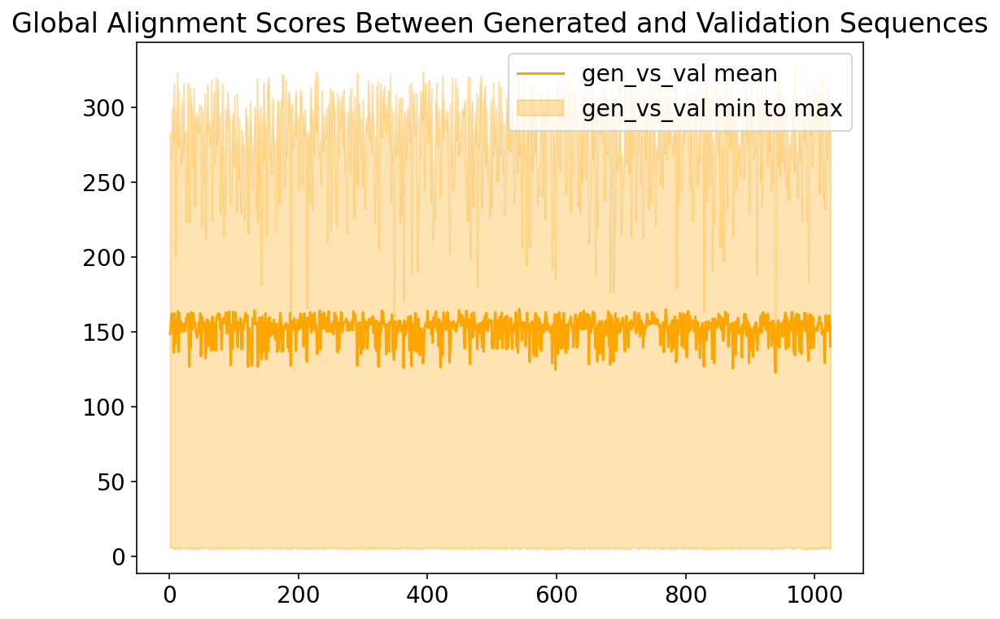

In [66]:
plt.plot(xvals, mean_gen_val_align_scores_matrix, label="gen_vs_val mean", color="orange")
plt.fill_between(xvals, min_gen_val_align_scores_matrix, max_gen_val_align_scores_matrix, alpha=0.3, color="orange", label="gen_vs_val min to max")
plt.legend()
plt.title("Global Alignment Scores Between Generated and Validation Sequences")

{'mean': array([148.64683406, 152.19268559, 159.32723799, ..., 160.74699782,
        155.66348253, 140.38919214]),
 'max': array([283., 271., 267., ..., 301., 282., 291.]),
 'min': array([6., 6., 6., ..., 6., 5., 5.])}

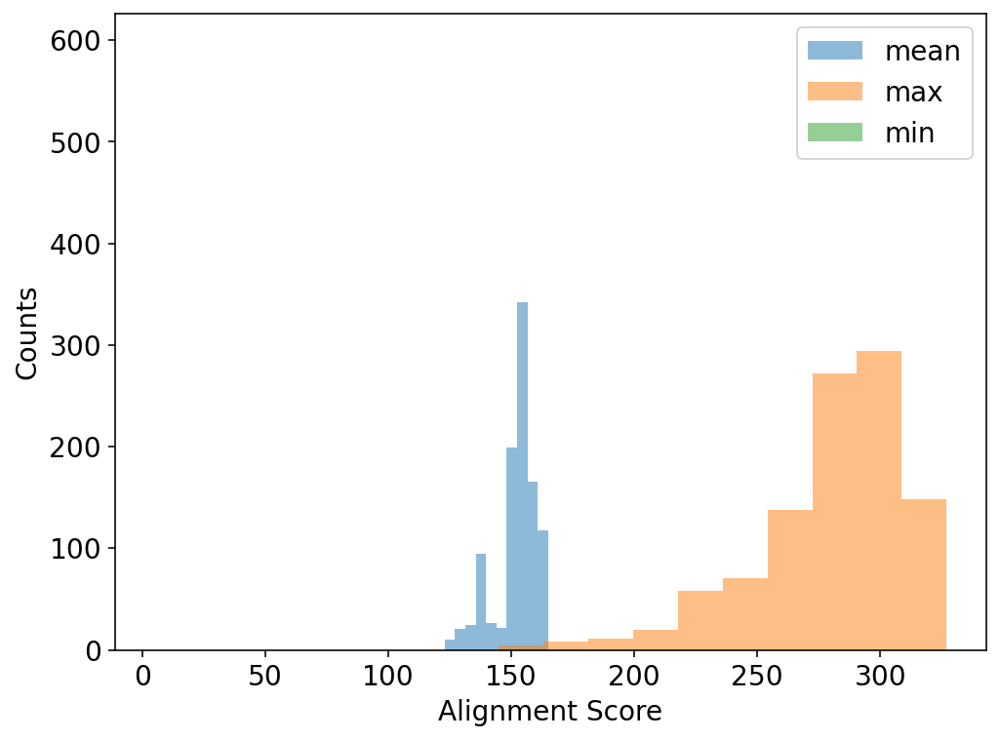

In [67]:
# plot a histogram showing the distributions of mean, max, and min alignment scores 
visualize.plot_align_hist_mean_max_min(scores_matrix=gen_val_align_scores_matrix)

Text(0.5, 1.0, 'Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences')

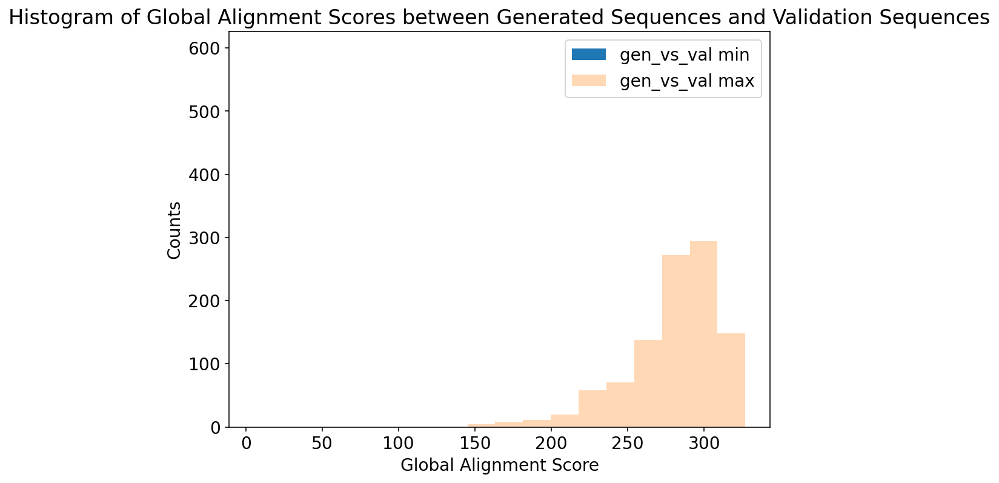

In [68]:
# if plotting only min and max alignment scores
# Note: min scores are too small and have too narrow of a distribution to be visualized
plt.hist(min_gen_val_align_scores_matrix, alpha=1, label="gen_vs_val min")
plt.hist(max_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val max")
plt.xlabel("Global Alignment Score")
plt.ylabel("Counts")
plt.legend() 
plt.title("Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences")

Text(0.5, 1.0, 'Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences')

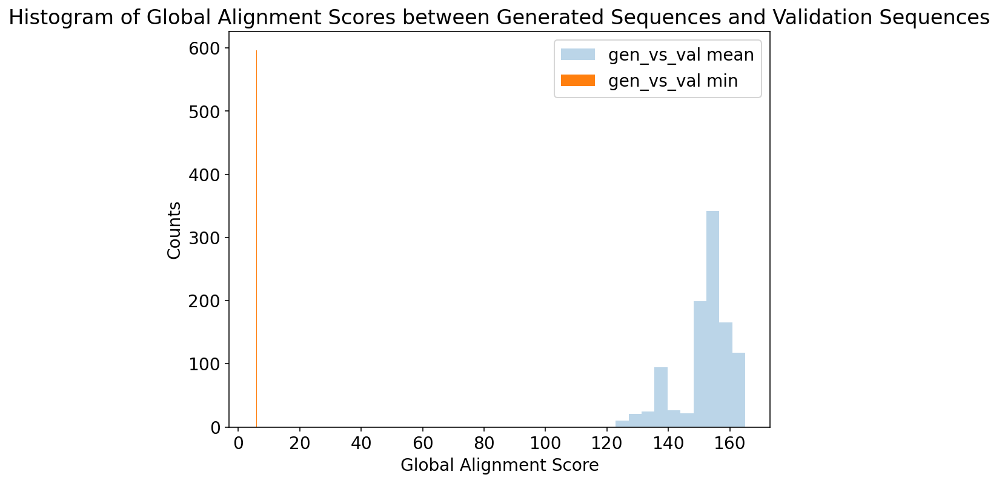

In [69]:
# if plotting only mean and min scores
plt.hist(mean_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val mean")
plt.hist(min_gen_val_align_scores_matrix, alpha=1, label="gen_vs_val min")
plt.xlabel("Global Alignment Score")
plt.ylabel("Counts")
plt.legend() 
plt.title("Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences")

Text(0.5, 1.0, 'Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences')

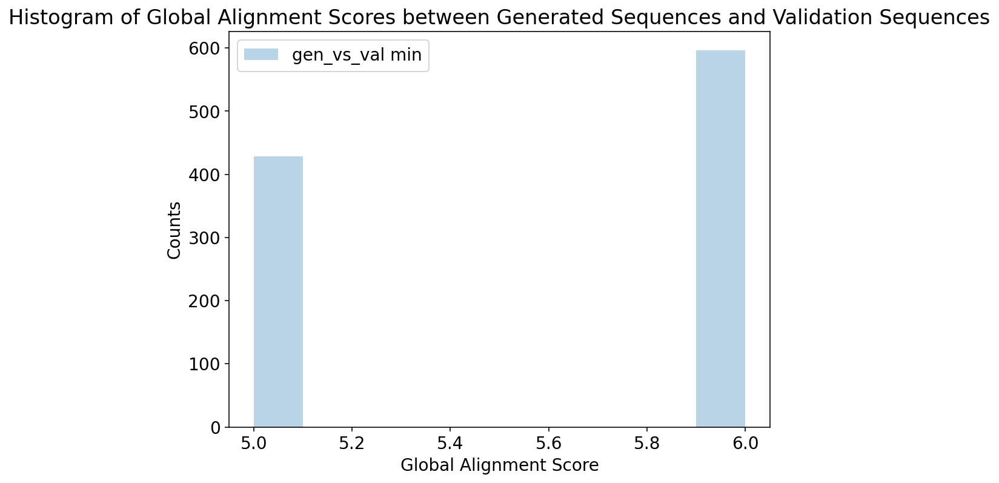

In [70]:
# if plotting only min scores
plt.hist(min_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val min")
plt.xlabel("Global Alignment Score")
plt.ylabel("Counts")
plt.legend() # loc="upper left")
plt.title("Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences")

### gen vs test sequences

Text(0.5, 1.0, 'Global Alignment Scores Between Generated and Test Sequences')

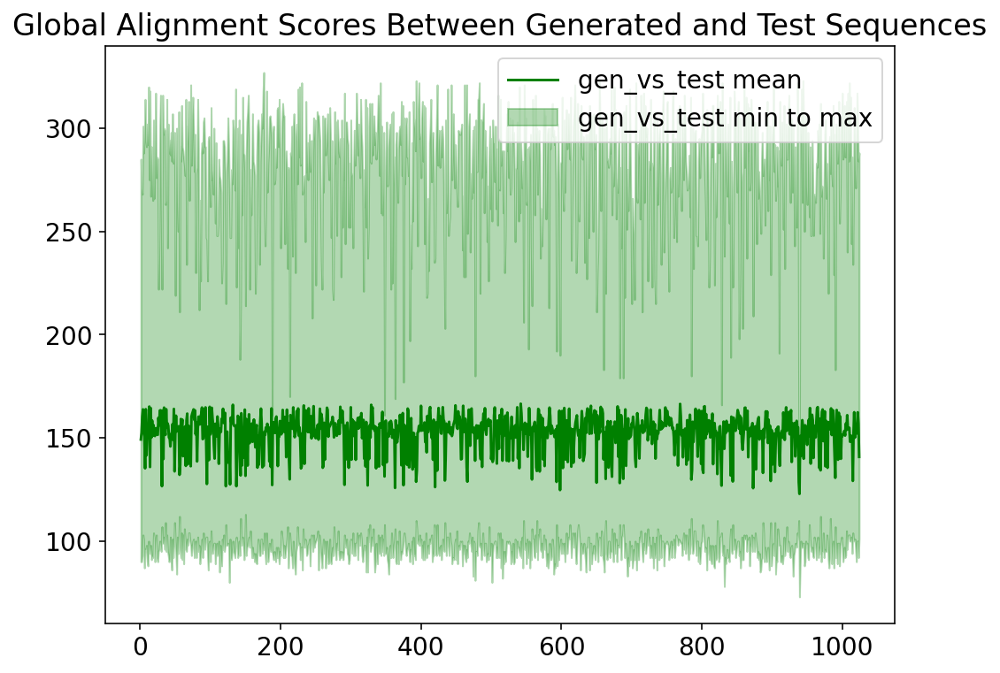

In [71]:
plt.plot(xvals, mean_gen_test_align_scores_matrix, label="gen_vs_test mean", color="green")
plt.fill_between(xvals, min_gen_test_align_scores_matrix, max_gen_test_align_scores_matrix, alpha=0.3, color="green", label="gen_vs_test min to max")
plt.legend()
plt.title("Global Alignment Scores Between Generated and Test Sequences")

{'mean': array([149.25793217, 152.50464989, 160.34436543, ..., 162.40536105,
        156.93271335, 140.82439825]),
 'max': array([285., 271., 268., ..., 302., 284., 288.]),
 'min': array([ 90.,  90.,  93., ..., 100.,  92., 101.])}

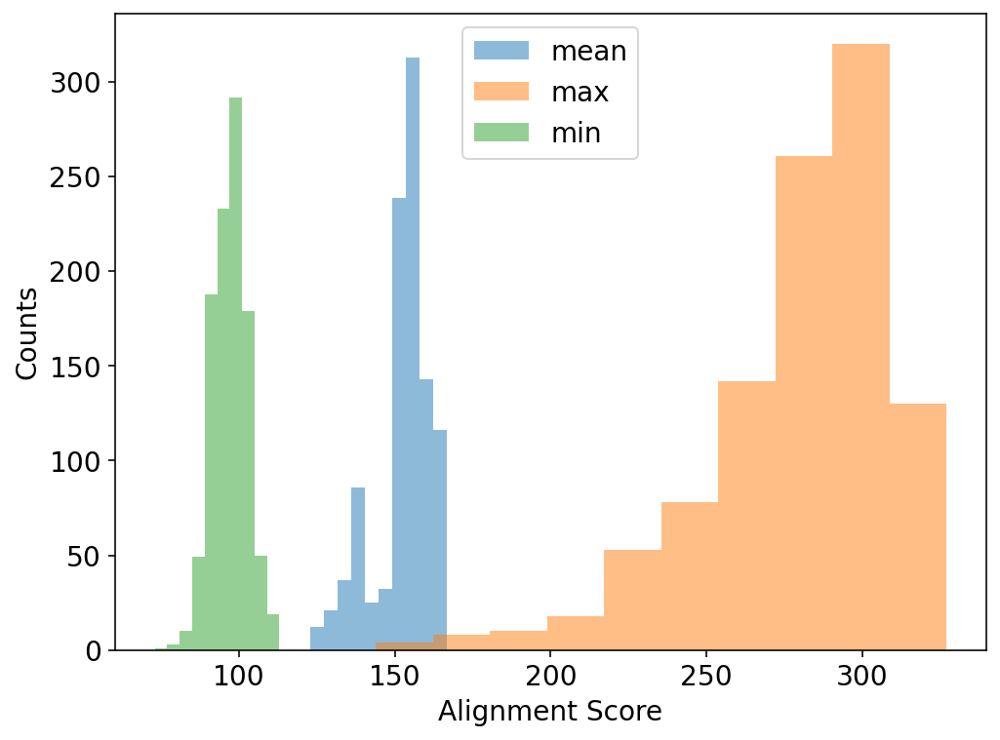

In [72]:
# plot a histogram showing the distributions of mean, max, and min alignment scores 
visualize.plot_align_hist_mean_max_min(scores_matrix=gen_test_align_scores_matrix)

# 6. Select 96 out of 1024 generated sequences with the highest mean or max global alignment score with validation or test sequences. Get their indices and values.

In [73]:
# number of sequences to select for
num_seqs = 96

### gen vs val sequences

In [74]:
# get the indces and corresponding alignment scores for the highest mean for num_seqs of sequences
mean_gen_val_selected_dict = metrics.select_seqs_from_alignment(
    scores_matrix=gen_val_align_scores_matrix, 
    num_seqs_selected=num_seqs, 
    select_type = "mean")
print(mean_gen_val_selected_dict)

{'selected seqs indices': array([864, 287, 381, 986, 637,  31, 749, 567, 681, 850, 739, 991, 926,
       411, 235, 646, 640, 890,  28, 329, 467, 795, 971, 266, 985, 208,
       202,   3,   7, 148, 470, 690, 721, 657, 726,  75,  36,  90,  47,
       566, 790, 171, 610, 514, 117, 255, 490, 553, 983, 224, 380, 636,
       186, 953, 471, 239,  14, 265, 963,  87, 424, 217, 861, 603, 101,
        33, 299, 430, 504, 919, 536, 860, 330, 720, 582, 747, 964, 802,
        92, 655,  98, 412,  12, 679, 246, 284, 803, 399, 459, 641, 232,
       131, 328, 448, 768, 541]), 'selected seqs scores': array([161.71670306, 161.72598253, 161.7308952 , 161.75873362,
       161.80131004, 161.81550218, 161.84497817, 161.8739083 ,
       161.87663755, 161.89683406, 161.91648472, 161.92358079,
       161.92658297, 161.9268559 , 161.94541485, 161.94978166,
       161.95578603, 161.95742358, 161.9746179 , 161.98062227,
       162.01091703, 162.03820961, 162.03902838, 162.04803493,
       162.05103712, 162.11326419,

In [75]:
# get the indces and corresponding alignment scores for the highest max for num_seqs of sequences
max_gen_val_selected_dict = metrics.select_seqs_from_alignment(
    scores_matrix=gen_val_align_scores_matrix, 
    num_seqs_selected=num_seqs, 
    select_type = "max")
print(max_gen_val_selected_dict)

{'selected seqs indices': array([  31,   37,  749,  248,  280,  151,  999,  332,  488,  712,  800,
        525,  750,  726,  869,  512,  892,  320,  757,  558,  839,   58,
        153,  923,  371,  480,  941, 1011,  832,  774,  326,   28,  600,
        862,  501,  670,  481,  373,  413,  783,    6,  396,  622,  313,
         81,  821,  916,   21,  612, 1007,  145,  322, 1020,  509,  179,
        307,  224,   64,  401,   74,  674,  442,  767,  135,  901, 1009,
        744,  696,  464,  653,  461,  618,  437,  845,  546,  152,  935,
        758,   71,  175,  422,  859,  548,  482,  174,  705,  341,  229,
        539,  943,  828,   11,  290,  392,  226,  968]), 'selected seqs scores': array([313., 313., 313., 313., 313., 313., 314., 314., 314., 314., 314.,
       314., 314., 314., 314., 314., 314., 314., 314., 315., 315., 315.,
       315., 315., 315., 315., 315., 315., 315., 316., 316., 316., 316.,
       316., 316., 316., 316., 316., 316., 316., 316., 316., 316., 316.,
       316., 316.

### gen vs test sequences

In [76]:
# get the indces and corresponding alignment scores for the highest mean for num_seqs of sequences
mean_gen_test_selected_dict = metrics.select_seqs_from_alignment(
    scores_matrix=gen_test_align_scores_matrix, 
    num_seqs_selected=num_seqs, 
    select_type = "mean")
print(mean_gen_test_selected_dict)

{'selected seqs indices': array([864, 596, 986, 749,  27,  31, 646, 235,  77, 640,  28, 926, 411,
       795, 850, 991, 329, 637, 681, 567, 739, 985, 202, 266, 208, 467,
       148, 726, 470, 971,  75, 690,   3, 721,   7,  36, 657,  90, 514,
       566,  47, 790, 117, 255, 610, 171, 380, 471, 636, 224, 186, 983,
       963, 239, 490, 553,  14, 953, 424, 603, 720, 860, 101, 265, 861,
        33, 582,  87, 330, 747, 504, 217,  92, 919, 536, 299, 430, 964,
       412, 655,  98, 284, 802,  12, 679, 803, 246, 641, 399, 459, 232,
       448, 328, 131, 768, 541]), 'selected seqs scores': array([163.13949672, 163.17724289, 163.20760394, 163.21389497,
       163.27242888, 163.27407002, 163.327407  , 163.33233042,
       163.37746171, 163.37828228, 163.38156455, 163.42915755,
       163.45705689, 163.48057987, 163.48796499, 163.48823851,
       163.49398249, 163.50875274, 163.51586433, 163.51723195,
       163.52051422, 163.53172867, 163.53610503, 163.58561269,
       163.66274617, 163.67778993,

In [77]:
# get the indces and corresponding alignment scores for the highest max for num_seqs of sequences
max_gen_test_selected_dict = metrics.select_seqs_from_alignment(
    scores_matrix=gen_test_align_scores_matrix, 
    num_seqs_selected=num_seqs, 
    select_type = "max")
print(max_gen_test_selected_dict)

{'selected seqs indices': array([ 586,  757,  488,  329,  749,  326,  388,  371,   68,  750, 1005,
        851,  401,  825,  892,  523,  994,  235,  910,  869,  481,   37,
        197,    6,  558,  413,  512,  313,  480,   64,   81,  320,  726,
        862,   74,  839,  145,  600,  612, 1011,  783,  774,  923,  509,
        338,  153,  562,   31,   28,  821,  712,   21,  999, 1007,  307,
        716,  290, 1020,  800,  174,  744,  758,  845,  179,   13,  224,
        670,  696,  941,  437,  135,  226,  539,  674,   11,  442,  422,
        859,   71,  618,  901,  461,  546,  464,  828,  482,  229,  705,
        396,  341, 1009,  935,  943,  653,  392,  175]), 'selected seqs scores': array([312., 312., 312., 312., 312., 312., 313., 313., 313., 313., 313.,
       313., 313., 313., 313., 313., 313., 313., 313., 314., 314., 314.,
       314., 314., 314., 314., 314., 314., 314., 314., 314., 314., 314.,
       315., 315., 315., 315., 315., 315., 315., 315., 316., 316., 316.,
       316., 316.

### Consider how well these selected sequences align with each other based on val/test alignments

In [78]:
xvals = np.arange(0, 96, 1)
print(len(xvals))

96


Text(0.5, 0, 'Index of Selected Sequences')

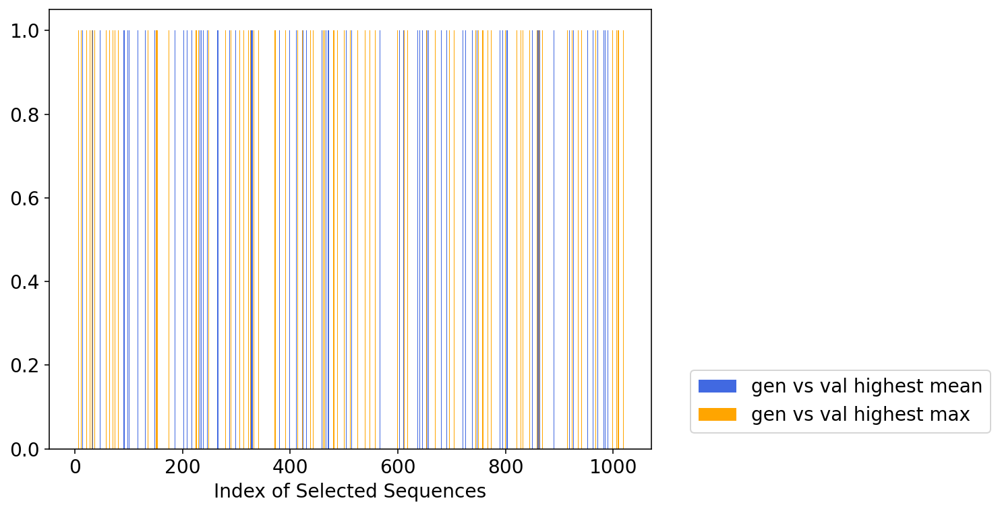

In [82]:
plt.hist(mean_gen_val_selected_dict["selected seqs indices"], bins=1024, color="royalblue", label="gen vs val highest mean")
plt.hist(max_gen_val_selected_dict["selected seqs indices"], bins=1024, color="orange", label="gen vs val highest max")
plt.legend(bbox_to_anchor =(1.05, 0.2))
plt.xlabel("Index of Selected Sequences")

Text(0.5, 0, 'Index of Selected Sequences')

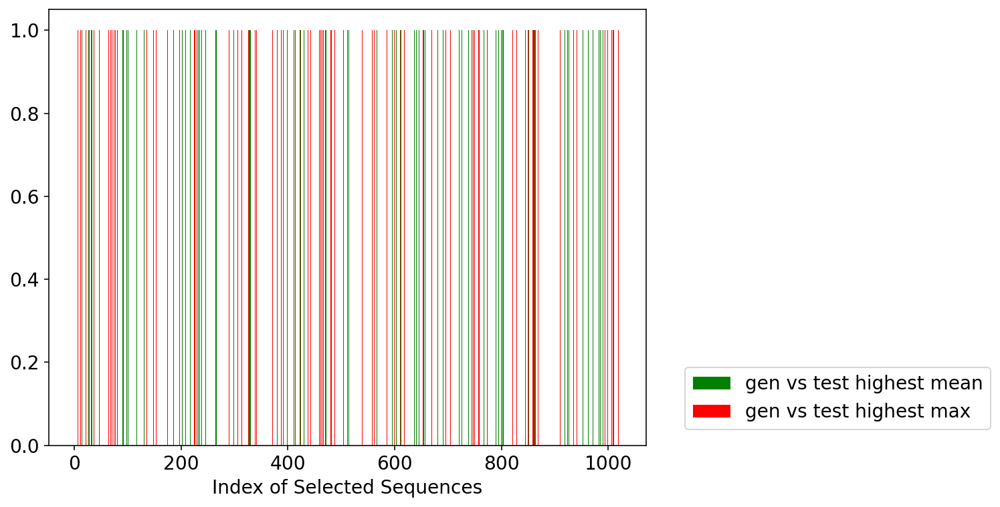

In [83]:
plt.hist(mean_gen_test_selected_dict["selected seqs indices"], bins=1024, color="green", label="gen vs test highest mean")
plt.hist(max_gen_test_selected_dict["selected seqs indices"], bins=1024, color="red", label="gen vs test highest max")
plt.legend(bbox_to_anchor =(1.05, 0.2))
plt.xlabel("Index of Selected Sequences")

# Getting mean/min/max values for 96 randomly sampled sequences in generated sequences 

In [84]:
# list of randomly sampled indices from 1024
seq_inds_list = [583, 594, 645, 155, 595, 62, 72, 476, 273, 250, 511, 629, 689, 980, 219, 517, 189, 847, 415, 84, 540, 308, 934, 118, 532, 703, 575, 527, 732, 179, 165, 1004, 852, 840, 600, 211, 848, 191, 890, 759, 64, 589, 260, 285, 1011, 658, 147, 110, 143, 340, 381, 103, 670, 23, 163, 513, 327, 940, 578, 825, 881, 439, 782, 180, 711, 442, 510, 353, 792, 401, 691, 228, 139, 49, 949, 846, 419, 246, 905, 744, 498, 433, 79, 438, 276, 270, 306, 720, 592, 542, 841, 242, 149, 791, 157, 573, 445]
seq_inds = np.array(seq_inds_list)

### gen vs val sequences

In [85]:
# mean
gen_val_mean_rand = mean_gen_val_align_scores_matrix[seq_inds]
print(gen_val_mean_rand.tolist())

[159.3228711790393, 154.77565502183407, 159.52701965065503, 147.04394104803492, 151.16184497816593, 154.55813318777294, 159.24072052401746, 138.57068777292577, 158.8193231441048, 152.87772925764193, 160.18422489082968, 157.16812227074234, 150.65747816593887, 153.56004366812226, 149.4099344978166, 150.082423580786, 156.2633733624454, 152.45633187772927, 156.32478165938863, 156.08569868995633, 151.92248908296943, 156.94596069868996, 157.2917576419214, 157.3610807860262, 150.99099344978166, 153.2183406113537, 137.28438864628822, 152.07723799126637, 155.51883187772927, 153.35152838427948, 155.24672489082968, 155.64055676855895, 153.8433406113537, 131.82232532751092, 161.67057860262008, 139.894923580786, 156.569596069869, 151.6563864628821, 161.957423580786, 150.84989082969432, 137.32887554585153, 149.6244541484716, 136.27729257641923, 159.867903930131, 151.3013100436681, 160.96724890829694, 154.23389737991266, 155.60125545851528, 160.3264192139738, 156.56713973799125, 161.73089519650654, 1

In [86]:
# min
gen_val_min_rand = min_gen_val_align_scores_matrix[seq_inds]
print(gen_val_min_rand.tolist())

[6.0, 6.0, 6.0, 6.0, 5.0, 6.0, 6.0, 6.0, 5.0, 6.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 5.0, 6.0, 5.0, 6.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 5.0, 5.0, 6.0, 5.0, 5.0, 5.0, 6.0, 5.0, 5.0, 5.0, 6.0, 5.0, 6.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 6.0, 6.0, 5.0, 6.0, 6.0, 5.0, 5.0, 6.0, 6.0, 5.0, 6.0, 5.0, 5.0, 6.0, 6.0, 5.0, 5.0, 5.0, 6.0, 6.0, 6.0, 5.0, 6.0, 6.0, 6.0, 5.0, 5.0, 6.0, 6.0, 5.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 5.0, 6.0, 5.0, 6.0, 5.0, 6.0, 6.0, 5.0, 6.0, 6.0, 6.0, 6.0, 6.0, 5.0, 5.0]


In [87]:
# max
gen_val_max_rand = max_gen_val_align_scores_matrix[seq_inds]
print(gen_val_max_rand.tolist())

[289.0, 305.0, 306.0, 266.0, 286.0, 286.0, 275.0, 180.0, 222.0, 267.0, 268.0, 289.0, 217.0, 293.0, 292.0, 289.0, 302.0, 305.0, 291.0, 272.0, 267.0, 306.0, 249.0, 294.0, 280.0, 260.0, 305.0, 270.0, 224.0, 318.0, 284.0, 292.0, 206.0, 191.0, 316.0, 278.0, 284.0, 274.0, 281.0, 249.0, 318.0, 289.0, 267.0, 226.0, 315.0, 278.0, 287.0, 229.0, 296.0, 276.0, 280.0, 230.0, 316.0, 284.0, 218.0, 285.0, 288.0, 296.0, 282.0, 313.0, 275.0, 251.0, 268.0, 267.0, 256.0, 319.0, 275.0, 280.0, 245.0, 318.0, 304.0, 290.0, 245.0, 221.0, 263.0, 298.0, 242.0, 303.0, 273.0, 320.0, 233.0, 202.0, 272.0, 245.0, 298.0, 294.0, 295.0, 296.0, 192.0, 280.0, 279.0, 288.0, 214.0, 250.0, 256.0, 277.0, 313.0]


### gen vs test sequences

In [88]:
# mean
gen_test_mean_rand = mean_gen_test_align_scores_matrix[seq_inds]
print(gen_test_mean_rand.tolist())

[160.66192560175054, 154.77680525164115, 161.15071115973743, 147.49206783369803, 151.93763676148797, 153.74972647702407, 160.2828227571116, 138.97784463894968, 160.20021881838073, 152.87062363238513, 161.04321663019692, 158.36241794310723, 151.30032822757113, 154.1980306345733, 150.3429978118162, 151.05798687089717, 157.50246170678338, 153.43079868708972, 157.51176148796498, 156.52078774617067, 152.55060175054706, 157.09190371991247, 158.26942013129104, 157.23003282275712, 151.7155361050328, 153.79376367614879, 136.36460612691465, 152.9206783369803, 156.71498905908095, 153.2409737417943, 156.2190919037199, 156.92532822757113, 154.41849015317285, 131.7866520787746, 163.054704595186, 139.08369803063457, 157.71498905908095, 152.42751641137855, 162.86980306345734, 150.54595185995623, 136.45131291028446, 150.47237417943109, 136.46963894967178, 160.80032822757113, 150.96198030634574, 161.890590809628, 155.10092997811816, 156.33424507658643, 161.95650984682715, 156.96198030634574, 163.0910831

In [89]:
# min
gen_test_min_rand = min_gen_test_align_scores_matrix[seq_inds]
print(gen_test_min_rand.tolist())

[96.0, 102.0, 98.0, 97.0, 91.0, 106.0, 93.0, 81.0, 97.0, 101.0, 92.0, 94.0, 92.0, 87.0, 88.0, 89.0, 91.0, 92.0, 90.0, 89.0, 93.0, 104.0, 97.0, 103.0, 90.0, 91.0, 96.0, 89.0, 92.0, 104.0, 89.0, 93.0, 93.0, 106.0, 99.0, 97.0, 95.0, 93.0, 93.0, 101.0, 96.0, 89.0, 101.0, 92.0, 100.0, 92.0, 91.0, 94.0, 98.0, 94.0, 99.0, 97.0, 95.0, 92.0, 94.0, 87.0, 95.0, 100.0, 88.0, 102.0, 94.0, 93.0, 94.0, 96.0, 100.0, 98.0, 101.0, 84.0, 100.0, 98.0, 95.0, 97.0, 94.0, 100.0, 99.0, 101.0, 106.0, 103.0, 91.0, 99.0, 93.0, 109.0, 92.0, 98.0, 100.0, 91.0, 99.0, 97.0, 108.0, 92.0, 96.0, 100.0, 113.0, 93.0, 98.0, 99.0, 92.0]


In [90]:
# max
gen_test_max_rand = max_gen_test_align_scores_matrix[seq_inds]
print(gen_test_max_rand.tolist())

[290.0, 302.0, 307.0, 222.0, 282.0, 282.0, 282.0, 180.0, 222.0, 272.0, 270.0, 285.0, 218.0, 292.0, 293.0, 289.0, 301.0, 305.0, 294.0, 265.0, 259.0, 301.0, 252.0, 294.0, 280.0, 217.0, 306.0, 271.0, 227.0, 318.0, 287.0, 295.0, 198.0, 189.0, 315.0, 280.0, 288.0, 275.0, 280.0, 247.0, 314.0, 292.0, 269.0, 228.0, 315.0, 285.0, 287.0, 253.0, 297.0, 277.0, 277.0, 268.0, 319.0, 286.0, 220.0, 282.0, 284.0, 296.0, 282.0, 313.0, 270.0, 254.0, 257.0, 269.0, 256.0, 321.0, 271.0, 291.0, 248.0, 313.0, 311.0, 283.0, 242.0, 219.0, 263.0, 305.0, 237.0, 305.0, 272.0, 318.0, 261.0, 203.0, 278.0, 248.0, 308.0, 297.0, 291.0, 296.0, 192.0, 284.0, 284.0, 284.0, 214.0, 248.0, 258.0, 297.0, 307.0]
